In [2]:
# Initialize Otter
import otter
grader = otter.Notebook("hw5.ipynb")

# CPSC 330 - Applied Machine Learning 

## Homework 5: Putting it all together 
### Associated lectures: All material till lecture 13 

**Due date: Monday, October 28th, 2024 at 11:59pm**

## Table of contents
0. [Submission instructions](#si)
1. [Understanding the problem](#1)
2. [Data splitting](#2)
3. [EDA](#3)
4. [Feature engineering](#4)
5. [Preprocessing and transformations](#5) 
6. [Baseline model](#6)
7. [Linear models](#7)
8. [Different models](#8)
9. [Feature selection](#9)
10. [Hyperparameter optimization](#10)
11. [Interpretation and feature importances](#11) 
12. [Results on the test set](#12)
13. [Summary of the results](#13)
14. [Your takeaway from the course](#15)

<div class="alert alert-info">

## Submission instructions
<hr>
rubric={points:4}

**You may work with a partner on this homework and submit your assignment as a group.** Below are some instructions on working as a group.  
- The maximum group size is 2. 
- Use group work as an opportunity to collaborate and learn new things from each other. 
- Be respectful to each other and make sure you understand all the concepts in the assignment well. 
- It's your responsibility to make sure that the assignment is submitted by one of the group members before the deadline. 
- You can find the instructions on how to do group submission on Gradescope [here](https://help.gradescope.com/article/m5qz2xsnjy-student-add-group-members).
- If you would like to use late tokens for the homework, all group members must have the necessary late tokens available. Please note that the late tokens will be counted for all members of the group.   


Follow the [homework submission instructions](https://github.com/UBC-CS/cpsc330-2024W1/blob/master/docs/homework_instructions.md). 

1. Before submitting the assignment, run all cells in your notebook to make sure there are no errors by doing `Kernel -> Restart Kernel and Clear All Outputs` and then `Run -> Run All Cells`. 
2. Notebooks with cell execution numbers out of order or not starting from "1" will have marks deducted. Notebooks without the output displayed may not be graded at all (because we need to see the output in order to grade your work).
3. Follow the [CPSC 330 homework instructions](https://ubc-cs.github.io/cpsc330-2024W1/docs/homework_instructions.html), which include information on how to do your assignment and how to submit your assignment.
4. Upload your solution on Gradescope. Check out this [Gradescope Student Guide](https://lthub.ubc.ca/guides/gradescope-student-guide/) if you need help with Gradescope submission. 
5. Make sure that the plots and output are rendered properly in your submitted file. If the .ipynb file is too big and doesn't render on Gradescope, also upload a pdf or html in addition to the .ipynb so that the TAs can view your submission on Gradescope.


_Note: The assignments will get gradually more open-ended as we progress through the course. In many cases, there won't be a single correct solution. Sometimes you will have to make your own choices and your own decisions (for example, on what parameter values to use when they are not explicitly provided in the instructions). Use your own judgment in such cases and justify your choices, if necessary._

</div>

<!-- BEGIN QUESTION -->

## Imports

<div class="alert alert-warning">
    
Imports
    
</div>

_Points:_ 0

In [3]:
import pandas as pd
import numpy as np

<!-- END QUESTION -->

## Introduction <a name="in"></a>

In this homework you will be working on an open-ended mini-project, where you will put all the different things you have learned so far together to solve an interesting problem.

A few notes and tips when you work on this mini-project: 

#### Tips
1. This mini-project is open-ended, and while working on it, there might be some situations where you'll have to use your own judgment and make your own decisions (as you would be doing when you work as a data scientist). Make sure you explain your decisions whenever necessary. 
2. **Do not include everything you ever tried in your submission** -- it's fine just to have your final code. That said, your code should be reproducible and well-documented. For example, if you chose your hyperparameters based on some hyperparameter optimization experiment, you should leave in the code for that experiment so that someone else could re-run it and obtain the same hyperparameters, rather than mysteriously just setting the hyperparameters to some (carefully chosen) values in your code. 
3. If you realize that you are repeating a lot of code try to organize it in functions. Clear presentation of your code, experiments, and results is the key to be successful in this lab. You may use code from lecture notes or previous lab solutions with appropriate attributions. 

#### Assessment
We plan to grade fairly and leniently. We don't have some secret target score that you need to achieve to get a good grade. **You'll be assessed on demonstration of mastery of course topics, clear presentation, and the quality of your analysis and results.** For example, if you just have a bunch of code and no text or figures, that's not good. If you do a bunch of sane things and get a lower accuracy than your friend, don't sweat it.


#### A final note
Finally, this style of this "project" question is different from other assignments. It'll be up to you to decide when you're "done" -- in fact, this is one of the hardest parts of real projects. But please don't spend WAY too much time on this... perhaps "a few hours" (15-20 hours???) is a good guideline for this project . Of course if you're having fun you're welcome to spend as much time as you want! But, if so, try not to do it out of perfectionism or getting the best possible grade. Do it because you're learning and enjoying it. Students from the past cohorts have found such kind of labs useful and fun and I hope you enjoy it as well. 

<br><br>

<!-- BEGIN QUESTION -->

## 1. Pick your problem and explain the prediction problem <a name="1"></a>
<hr>
rubric={points:3}

In this mini project, you have the option to choose on which dataset you will be working on. The tasks you will need to carry on will be similar, independently of your choice.

### Option 1
You can choose to work on a classification problem of predicting whether a credit card client will default or not. 
For this problem, you will use [Default of Credit Card Clients Dataset](https://www.kaggle.com/uciml/default-of-credit-card-clients-dataset). In this data set, there are 30,000 examples and 24 features, and the goal is to estimate whether a person will default (fail to pay) their credit card bills; this column is labeled "default.payment.next.month" in the data. The rest of the columns can be used as features. You may take some ideas and compare your results with [the associated research paper](https://www.sciencedirect.com/science/article/pii/S0957417407006719), which is available through [the UBC library](https://www.library.ubc.ca/). 


### Option 2
You can choose to work on a regression problem using a [dataset](https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data) of New York City Airbnb listings from 2019. As usual, you'll need to start by downloading the dataset, then you will try to predict `reviews_per_month`, as a proxy for the popularity of the listing. Airbnb could use this sort of model to predict how popular future listings might be before they are posted, perhaps to help guide hosts create more appealing listings. In reality they might instead use something like vacancy rate or average rating as their target, but we do not have that available here.

> Note there is an updated version of this dataset with more features available [here](http://insideairbnb.com/). The features were are using in `listings.csv.gz` for the New York city datasets. You will also see some other files like `reviews.csv.gz`. For your own interest you may want to explore the expanded dataset and try your analysis there. However, please submit your results on the dataset obtained from Kaggle.


**Your tasks:**

1. Spend some time understanding the options and pick the one you find more interesting (it may help spending some time looking at the documentation available on Kaggle for each dataset).
2. After making your choice, focus on understanding the problem and what each feature means, again using the documentation on the dataset page on Kaggle. Write a few sentences on your initial thoughts on the problem and the dataset. 
3. Download the dataset and read it as a pandas dataframe. 

<div class="alert alert-warning">
    
Solution_1
    
</div>

_Points:_ 3

**1.** We will choose *Option 2*. We will work on the regression problem using the dataset of New York City Airbnb listings from 2019.

**2.** The dataset has 16 columns and 48,895 rows. We will predict `reviews_per_month`, which is the column in the dataset that best represents the overall popularity of the listing. The other columns contain useful information such as the name, host, location, room type, price, availability, number of reviews, and more.

Overall, interpretability will be important for this problem---one use case for this model could be to help hosts understand what features of their listing are most important for attracting guests. Hence, we will carefully select our features and prioritize models that are easy to interpret such as linear regression.

Not all columns will be useful for the prediction (e.g. `id`). To keep our model simple, we will use recursive feature elimination and potentially manual feature engineering to find a subset of features with the most predictive power.

In terms of pre-processing, the dataset contains diverse numerical ranges, outliers, and missing values that need to be scaled, removed, and imputed, respectively. We will most likely also need to encode the categorical variables in a numerical format (e.g. one-hot or ordinal), depending on the requirements of the model we choose.

In [4]:
listings = pd.read_csv('data/AB_NYC_2019.csv')

display(listings.info(), listings.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

None

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 2. Data splitting <a name="2"></a>
<hr>
rubric={points:2}

**Your tasks:**

1. Split the data into train (70%) and test (30%) portions with `random_state=123`.

> If your computer cannot handle training on 70% training data, make the test split bigger.  

<div class="alert alert-warning">
    
Solution_2
    
</div>

_Points:_ 2

In [5]:
from sklearn.model_selection import train_test_split

# Note: There are some rows where the target variable 'reviews_per_month' is NaN.
# We cannot train a model or evaluate its accuracy on these rows without knowing
# the target value so we will immediately filter out these rows from the dataset.
listings = listings[listings['reviews_per_month'].notna()]

listings_x = listings.drop(columns=['reviews_per_month'])
listings_y = listings['reviews_per_month']
listings_test_x, listings_train_x, listings_test_y, listings_train_y = train_test_split(listings_x, listings_y, test_size=0.3, random_state=123)

display(listings_train_x.head(), listings_train_y.head())

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,calculated_host_listings_count,availability_365
17247,13642568,Luxe & Spacious Williamsburg Studio,79167228,Nate,Brooklyn,Williamsburg,40.71666,-73.95447,Entire home/apt,105,5,11,2018-08-06,1,0
9782,7516992,Bedroom in Midtown Apartment,29544115,Chisom,Manhattan,Midtown,40.75737,-73.96916,Private room,70,1,1,2015-08-24,1,0
593,224510,"BEAUTIFUL APARTMENT, GREAT LOCATION",991380,Stefania,Brooklyn,Boerum Hill,40.68653,-73.98562,Entire home/apt,230,4,18,2018-07-05,1,0
33216,26224487,3 bedroom 1200sq ft apt with exposed brick & deck,55978113,Alexis,Staten Island,Stapleton,40.63701,-74.07624,Private room,50,1,21,2019-07-07,2,363
460,162493,Prime Williamsburg 3 BR with Deck,776490,Andres,Brooklyn,Williamsburg,40.71323,-73.95745,Entire home/apt,450,5,37,2018-12-27,1,15


17247    0.30
9782     0.02
593      0.21
33216    1.81
460      0.79
Name: reviews_per_month, dtype: float64

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 3. EDA <a name="3"></a>
<hr>
rubric={points:10}

**Your tasks:**

1. Perform exploratory data analysis on the train set.
2. Include at least two summary statistics and two visualizations that you find useful, and accompany each one with a sentence explaining it.
3. Summarize your initial observations about the data. 
4. Pick appropriate metric/metrics for assessment. 

<div class="alert alert-warning">
    
Solution_3
    
</div>

_Points:_ 10

@Michael TODO: FIX THIS

```md
3. There appears to be a negative correlation between price and number of reviews
   
   Interestingly, there are 2 listings where the price is 0.

   A vast majority of listings fall into the Manhanttan and Brookyln neighborhoods.

   As expected, shared room is the cheapest and entire home/apt is the most expensive(on average).
   
4. We will be using Root Mean Square Error, since we are predicting a continous value and want to penalize larger errors.
 
   We will also be using MAPE to understand average prediction error.
   
   R squared will be included as well.
```

In [6]:
display(listings.describe())

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,3.884300e+04,3.884300e+04,38843.000000,38843.000000,38843.000000,38843.000000,38843.000000,38843.000000,38843.000000,38843.000000
mean,1.809646e+07,6.423915e+07,40.728134,-73.951148,142.317947,5.868059,29.297557,1.373221,5.164457,114.882888
std,1.069370e+07,7.588847e+07,0.054990,0.046695,196.945624,17.384784,48.186374,1.680442,26.295665,129.543636
min,2.539000e+03,2.438000e+03,40.506410,-74.244420,0.000000,1.000000,1.000000,0.010000,1.000000,0.000000
25%,8.720027e+06,7.033824e+06,40.688640,-73.982470,69.000000,1.000000,3.000000,0.190000,1.000000,0.000000
50%,1.887146e+07,2.837193e+07,40.721710,-73.954800,101.000000,2.000000,9.000000,0.720000,1.000000,55.000000
75%,2.755482e+07,1.018465e+08,40.762990,-73.935020,170.000000,4.000000,33.000000,2.020000,2.000000,229.000000
max,3.645581e+07,2.738417e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


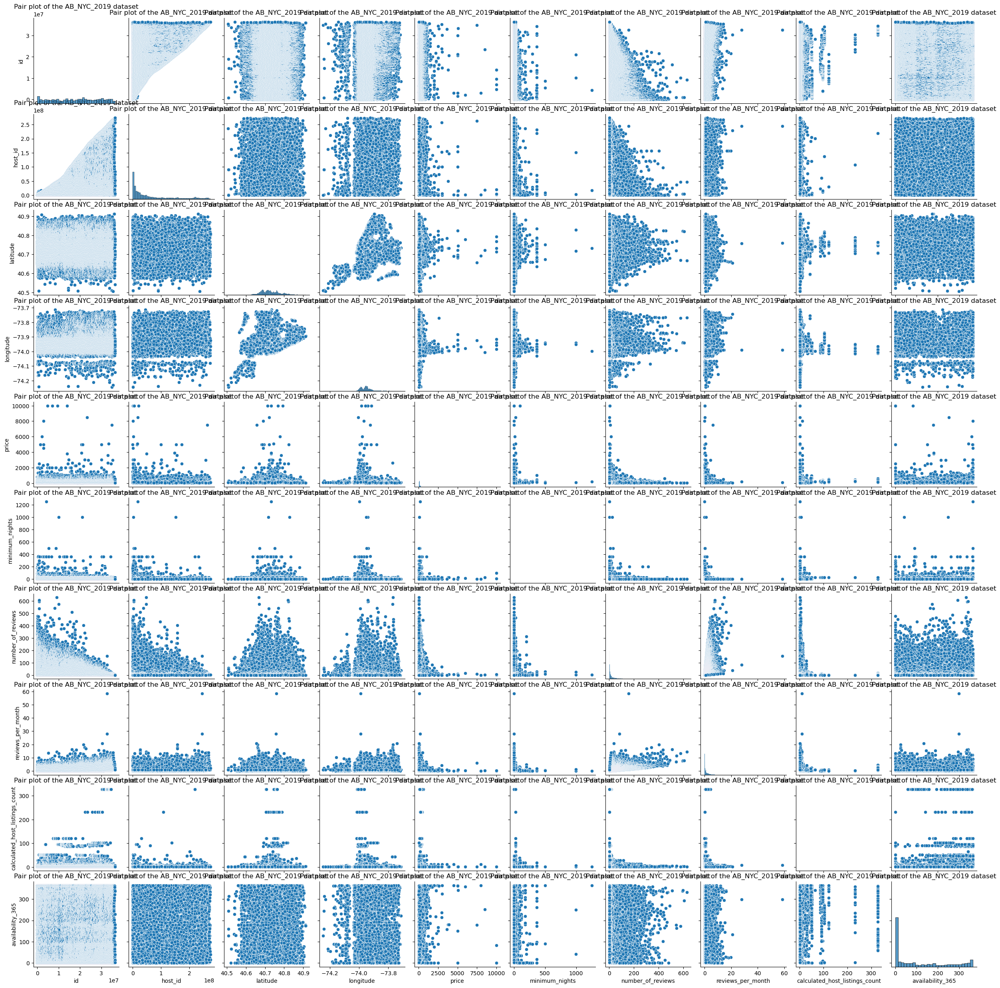

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

ax = sns.pairplot(data=listings)
ax.set(title='Pair plot of the AB_NYC_2019 dataset')

plt.show()

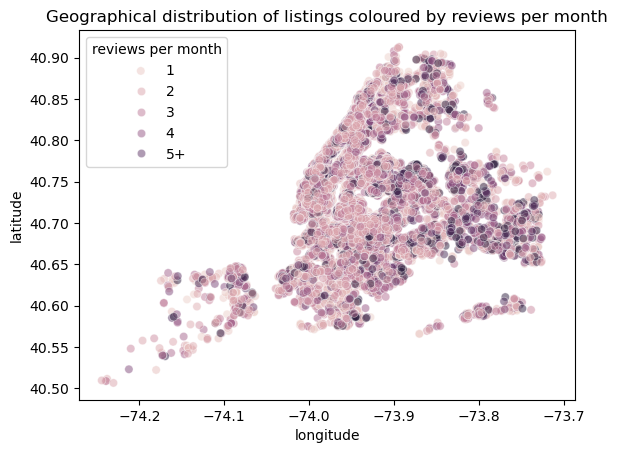

In [8]:
# Most of the 'reviews_per_month' values are between 0 and 5, so
# we will clip the values to this range for better visualization.
ax = sns.scatterplot(x=listings['longitude'], y=listings['latitude'], hue=np.clip(listings['reviews_per_month'], 0, 5), alpha=0.5)
ax.legend(title='reviews per month', labels=['1', '2', '3', '4', '5+'])
ax.set(title='Geographical distribution of listings coloured by reviews per month', xlabel='longitude', ylabel='latitude')

plt.show()

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 4. Feature engineering <a name="4"></a>
<hr>
rubric={points:1}

**Your tasks:**

1. Carry out feature engineering. In other words, extract new features relevant for the problem and work with your new feature set in the following exercises. You may have to go back and forth between feature engineering and preprocessing. 

<div class="alert alert-warning">
    
Solution_4
    
</div>

_Points:_ 1

In [9]:
def transform_and_drop_features(data: pd.DataFrame) -> pd.DataFrame:
    # We drop the 'id' and 'host_id' features because they are simply unique identifiers
    # and do not have any predictive power alone. We drop 'name' and 'host_name' as well,
    # which are too computationally expensive to encode with a count vectorizer. We drop
    # 'latitude', 'longitude', and 'last_review' because they are already represented by
    # engineered features.
    data = data.copy()
    drop_features = ['id', 'name', 'host_id', 'host_name', 'latitude', 'longitude', 'last_review']

    # Pricing features.
    data['relative_price_within_neighbourhood'] = data.groupby('neighbourhood')['price'].transform(lambda x: x - x.mean())
    data['minimum_spend'] = data['minimum_nights'] * data['price']

    # Time features ('2019-07-07' is the most recent timestamp in 'last_review').
    data['days_since_last_review'] = (pd.to_datetime('2019-07-07') - pd.to_datetime(data['last_review'])).dt.days

    # Host features.
    data['mean_number_of_reviews_for_host'] = data.groupby('host_id')['number_of_reviews'].transform('sum') / data['calculated_host_listings_count']

    # Location features (coordinates from 'https://www.latlong.net/').
    data['dist_to_statue_of_liberty'] = np.sqrt((data['latitude'] - 40.689247) ** 2 + (data['longitude'] + 74.044502) ** 2)
    data['dist_to_empire_state'] = np.sqrt((data['latitude'] - 40.748817) ** 2 + (data['longitude'] + 73.985428) ** 2)
    data['dist_to_times_square'] = np.sqrt((data['latitude'] - 40.758896) ** 2 + (data['longitude'] + 73.985130) ** 2)
    data['dist_to_central_park'] = np.sqrt((data['latitude'] - 40.785091) ** 2 + (data['longitude'] + 73.968285) ** 2)

    return data.drop(columns=drop_features)

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 5. Preprocessing and transformations <a name="5"></a>
<hr>
rubric={points:10}

**Your tasks:**

1. Identify different feature types and the transformations you would apply on each feature type. 
2. Define a column transformer, if necessary. 

<div class="alert alert-warning">
    
Solution_5
    
</div>

_Points:_ 10

In [37]:
from sklearn.compose import make_column_transformer
from sklearn.discriminant_analysis import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import FunctionTransformer, make_pipeline
from sklearn.preprocessing import OneHotEncoder

numeric_features = ['price', 'minimum_nights', 'number_of_reviews', 'calculated_host_listings_count', 'availability_365', 'relative_price_within_neighbourhood', 'minimum_spend', 'days_since_last_review', 'mean_number_of_reviews_for_host', 'dist_to_statue_of_liberty', 'dist_to_empire_state', 'dist_to_times_square', 'dist_to_central_park']
categorical_features = ['neighbourhood_group', 'neighbourhood', 'room_type']

def transform_and_drop_features_names(_: FunctionTransformer, __: list) -> list:
    # Everything from 'numeric_features' and 'categorical_features' in a certain order.
    all_features = ['neighbourhood_group', 'neighbourhood', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'calculated_host_listings_count', 'availability_365', 'relative_price_within_neighbourhood', 'minimum_spend', 'days_since_last_review', 'mean_number_of_reviews_for_host', 'dist_to_statue_of_liberty', 'dist_to_empire_state', 'dist_to_times_square', 'dist_to_central_park']

    return all_features

transform_pipeline = make_pipeline(
    FunctionTransformer(transform_and_drop_features, feature_names_out=transform_and_drop_features_names),
    make_column_transformer(
        [ make_pipeline(SimpleImputer(), StandardScaler()), numeric_features ],
        [ make_pipeline(SimpleImputer(strategy='most_frequent'), OneHotEncoder(handle_unknown='ignore', sparse_output=False)), categorical_features ]))

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 6. Baseline model <a name="6"></a>
<hr>
rubric={points:2}

**Your tasks:**
1. Try `scikit-learn`'s baseline model and report results.

<div class="alert alert-warning">
    
Solution_6
    
</div>

_Points:_ 2

@Michael TODO: FIX THIS

The dummy Regressor appears to model the given data very poorly, as suggested by the negative r squared score

In [11]:
from sklearn.dummy import DummyRegressor
from sklearn.model_selection import cross_validate

baseline_pipeline = make_pipeline(transform_pipeline, DummyRegressor())
baseline_cv = pd.DataFrame(cross_validate(baseline_pipeline, listings_train_x, listings_train_y, return_train_score=True))

display(baseline_cv)

,fit_time,score_time,test_score,train_score
0,0.030630,0.014525,-0.000028,0.0
1,0.025925,0.013707,-0.000222,0.0
2,0.026220,0.013642,-0.001722,0.0
3,0.027734,0.014127,-0.000032,0.0
4,0.031521,0.015604,-0.000128,0.0


<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 7. Linear models <a name="7"></a>
<hr>
rubric={points:10}

**Your tasks:**

1. Try a linear model as a first real attempt. 
2. Carry out hyperparameter tuning to explore different values for the complexity hyperparameter. 
3. Report cross-validation scores along with standard deviation. 
4. Summarize your results.

<div class="alert alert-warning">
    
Solution_7
    
</div>

_Points:_ 10

@Michael TODO: FIX THIS

It would appear that the Ridge model can only perform mediocorely, with a validation score of 0.49 at the highest.
There doesn't appear to be any overfitting, and the training score vs test score seem to fairly close.

In [12]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.pipeline import Pipeline

def optimize_hyperparameters(pipeline: Pipeline, grid: dict, use_random_search: bool) -> tuple[Pipeline, pd.DataFrame]:    
    if use_random_search:
        search = RandomizedSearchCV(pipeline, grid, n_iter=100, n_jobs=8, cv=3, random_state=123, return_train_score=True)
        search.fit(listings_train_x, listings_train_y)
    else:
        search = GridSearchCV(pipeline, grid, n_jobs=8, cv=3, return_train_score=True)
        search.fit(listings_train_x, listings_train_y)

    return search.best_estimator_, pd.DataFrame(search.cv_results_)

def get_cv_metrics(pipeline: Pipeline) -> pd.DataFrame:
    # We use only R2 for optimizing the hyperparameters, but for evaluation we will use all
    # three metrics since they provide a more comprehensive view of the model's performance.
    metrics = ['r2', 'neg_root_mean_squared_error', 'neg_mean_absolute_percentage_error']

    return pd.DataFrame(cross_validate(pipeline, listings_train_x, listings_train_y, scoring=metrics, return_train_score=True))

In [13]:
from sklearn.linear_model import Ridge

optimized_ridge_pipeline, ridge_search_cv = optimize_hyperparameters(make_pipeline(transform_pipeline, Ridge(random_state=123)), { 'ridge__alpha': range(1, 100) }, False)
optimized_ridge_cv = get_cv_metrics(optimized_ridge_pipeline)

display(optimized_ridge_pipeline, optimized_ridge_cv)

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('functiontransformer',
                                  FunctionTransformer(func=<function transform_and_drop_features at 0x3136618a0>)),
                                 ('columntransformer',
                                  ColumnTransformer(transformers=[('pipeline-1',
                                                                   Pipeline(steps=[('simpleimputer',
                                                                                    SimpleImputer()),
                                                                                   ('standardscaler',
                                                                                    StandardScaler())]),
                                                                   ['price',
                                                                    'minimum_nights',
                                                                    'number_of_reviews',
                                                                    'cal...
                                                                    'dist_to_statue_of_liberty',
                                                                    'dist_to_empire_state',
                                                                    'dist_to_times_square',
                                                                    'dist_to_central_park']),
                                                                  ('pipeline-2',
                                                                   Pipeline(steps=[('simpleimputer',
                                                                                    SimpleImputer(strategy='most_frequent')),
                                                                                   ('onehotencoder',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  sparse_output=False))]),
                                                                   ['neighbourhood_group',
                                                                    'neighbourhood',
                                                                    'room_type'])]))])),
                ('ridge', Ridge(alpha=24, random_state=123))])

,fit_time,score_time,test_r2,train_r2,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error
0,0.041976,0.015334,0.428109,0.400580,-1.247359,-1.388727,-3.156918,-2.950881
1,0.037013,0.014615,0.458590,0.391876,-1.327437,-1.369411,-2.783058,-3.036091
2,0.040247,0.014898,0.371015,0.413794,-1.267356,-1.382036,-3.198359,-2.961303
3,0.036321,0.014659,0.315208,0.436408,-1.693858,-1.267405,-2.951256,-2.981755
4,0.037111,0.014630,0.417042,0.403884,-1.293061,-1.376913,-3.006839,-2.960646


<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 8. Different models <a name="8"></a>
<hr>
rubric={points:12}

**Your tasks:**
1. Try at least 3 other models aside from a linear model. One of these models should be a tree-based ensemble model. 
2. Summarize your results in terms of overfitting/underfitting and fit and score times. Can you beat a linear model? 

<div class="alert alert-warning">
    
Solution_8
    
</div>

_Points:_ 12

@Michael TODO: FIX THIS

notes:
- **decision tree**: is severely overfitting. performs objectively poorly, but surprisingly good for a simple decision tree model. the cv finished very fast because the model is simple but its probably not complex enough to capture the subtle relationships in the dataset.

- **knn**: is mildly overfitting. performs objectively poorly, worse than decision tree pretty much across the board. cv is insanely slow because all the computation happens at prediction time and the curse of dimensionality. i didnt see a lot of clustering in the EDA so knn probably isnt a good choice of model for this problem space

- **lgbm**: is somewhat overfitting. performs mediocrely but is the best out of all models. cv was decently fast but the random search is not exhaustive. this is probably the best choice purely because it is the only model whose accuracy is even close to acceptable.

- comparison to linear: linear is horrendous. everything is better than linear.

In [14]:
from sklearn.tree import DecisionTreeRegressor

optimized_decision_tree_pipeline, decision_tree_search_cv = optimize_hyperparameters(make_pipeline(transform_pipeline, DecisionTreeRegressor(random_state=123)), { 'decisiontreeregressor__max_depth': range(1, 100) }, False)
optimized_decision_tree_cv = get_cv_metrics(optimized_decision_tree_pipeline)

display(optimized_decision_tree_pipeline, optimized_decision_tree_cv)

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('functiontransformer',
                                  FunctionTransformer(func=<function transform_and_drop_features at 0x3136618a0>)),
                                 ('columntransformer',
                                  ColumnTransformer(transformers=[('pipeline-1',
                                                                   Pipeline(steps=[('simpleimputer',
                                                                                    SimpleImputer()),
                                                                                   ('standardscaler',
                                                                                    StandardScaler())]),
                                                                   ['price',
                                                                    'minimum_nights',
                                                                    'number_of_reviews',
                                                                    'cal...
                                                                    'dist_to_times_square',
                                                                    'dist_to_central_park']),
                                                                  ('pipeline-2',
                                                                   Pipeline(steps=[('simpleimputer',
                                                                                    SimpleImputer(strategy='most_frequent')),
                                                                                   ('onehotencoder',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  sparse_output=False))]),
                                                                   ['neighbourhood_group',
                                                                    'neighbourhood',
                                                                    'room_type'])]))])),
                ('decisiontreeregressor',
                 DecisionTreeRegressor(max_depth=5, random_state=123))])

,fit_time,score_time,test_r2,train_r2,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error
0,0.073524,0.015053,0.573707,0.622532,-1.076934,-1.102024,-0.907532,-0.864569
1,0.072784,0.015097,0.542183,0.627800,-1.220666,-1.071337,-0.852400,-0.863019
2,0.072492,0.015211,0.471518,0.634098,-1.161698,-1.091885,-0.881720,-0.864289
3,0.072505,0.015140,0.536314,0.616791,-1.393829,-1.045083,-0.837923,-0.853275
4,0.072360,0.014877,0.546916,0.630371,-1.139960,-1.084238,-0.903881,-0.857376


In [15]:
from sklearn.neighbors import KNeighborsRegressor

optimized_knn_pipeline, knn_search_cv = optimize_hyperparameters(make_pipeline(transform_pipeline, KNeighborsRegressor()), { 'kneighborsregressor__n_neighbors': range(1, 100) }, False)
optimized_knn_cv = get_cv_metrics(optimized_knn_pipeline)

display(optimized_knn_pipeline, optimized_knn_cv)

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('functiontransformer',
                                  FunctionTransformer(func=<function transform_and_drop_features at 0x3136618a0>)),
                                 ('columntransformer',
                                  ColumnTransformer(transformers=[('pipeline-1',
                                                                   Pipeline(steps=[('simpleimputer',
                                                                                    SimpleImputer()),
                                                                                   ('standardscaler',
                                                                                    StandardScaler())]),
                                                                   ['price',
                                                                    'minimum_nights',
                                                                    'number_of_reviews',
                                                                    'cal...
                                                                    'dist_to_empire_state',
                                                                    'dist_to_times_square',
                                                                    'dist_to_central_park']),
                                                                  ('pipeline-2',
                                                                   Pipeline(steps=[('simpleimputer',
                                                                                    SimpleImputer(strategy='most_frequent')),
                                                                                   ('onehotencoder',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  sparse_output=False))]),
                                                                   ['neighbourhood_group',
                                                                    'neighbourhood',
                                                                    'room_type'])]))])),
                ('kneighborsregressor', KNeighborsRegressor(n_neighbors=15))])

,fit_time,score_time,test_r2,train_r2,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error
0,0.027431,0.123182,0.481060,0.488282,-1.188211,-1.283118,-1.415748,-1.363940
1,0.032076,0.079527,0.445201,0.478243,-1.343750,-1.268446,-1.473126,-1.354614
2,0.031479,0.083900,0.421382,0.499398,-1.215554,-1.277145,-1.517630,-1.343067
3,0.030828,0.079892,0.340985,0.522790,-1.661672,-1.166239,-1.397078,-1.359941
4,0.032119,0.080521,0.456182,0.494767,-1.248898,-1.267615,-1.420428,-1.337112


In [16]:
from lightgbm import LGBMRegressor

# There are two hyperparameters to optimize for this model. Exhaustive grid search would
# be far too computationally expensive, so we will have to use randomized search instead.
optimized_light_gbm_pipeline, light_gbm_search_cv = optimize_hyperparameters(make_pipeline(transform_pipeline, LGBMRegressor(random_state=123, force_col_wise=True)), { 'lgbmregressor__n_estimators': range(1, 100), 'lgbmregressor__max_depth': range(1, 100) }, True)
optimized_light_gbm_cv = get_cv_metrics(optimized_light_gbm_pipeline)

display(optimized_light_gbm_pipeline, optimized_light_gbm_cv)

[LightGBM] [Info] Total Bins 3002
[LightGBM] [Info] Number of data points in the train set: 7768, number of used features: 80
[LightGBM] [Info] Start training from score 1.390106
[LightGBM] [Info] Total Bins 3002
[LightGBM] [Info] Number of data points in the train set: 7768, number of used features: 80
[LightGBM] [Info] Start training from score 1.390106
[LightGBM] [Info] Total Bins 3005
[LightGBM] [Info] Number of data points in the train set: 7769, number of used features: 82
[LightGBM] [Info] Start training from score 1.402318
[LightGBM] [Info] Total Bins 3002
[LightGBM] [Info] Number of data points in the train set: 7768, number of used features: 80
[LightGBM] [Info] Start training from score 1.390106
[LightGBM] [Info] Total Bins 3005
[LightGBM] [Info] Number of data points in the train set: 7769, number of used features: 82
[LightGBM] [Info] Start training from score 1.402318
[LightGBM] [Info] Total Bins 2999
[LightGBM] [Info] Number of data points in the train set: 7769, number 

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('functiontransformer',
                                  FunctionTransformer(func=<function transform_and_drop_features at 0x3136618a0>)),
                                 ('columntransformer',
                                  ColumnTransformer(transformers=[('pipeline-1',
                                                                   Pipeline(steps=[('simpleimputer',
                                                                                    SimpleImputer()),
                                                                                   ('standardscaler',
                                                                                    StandardScaler())]),
                                                                   ['price',
                                                                    'minimum_nights',
                                                                    'number_of_reviews',
                                                                    'cal...
                                                                    'dist_to_central_park']),
                                                                  ('pipeline-2',
                                                                   Pipeline(steps=[('simpleimputer',
                                                                                    SimpleImputer(strategy='most_frequent')),
                                                                                   ('onehotencoder',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  sparse_output=False))]),
                                                                   ['neighbourhood_group',
                                                                    'neighbourhood',
                                                                    'room_type'])]))])),
                ('lgbmregressor',
                 LGBMRegressor(force_col_wise=True, max_depth=9,
                               n_estimators=93, random_state=123))])

,fit_time,score_time,test_r2,train_r2,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error
0,0.309134,0.017244,0.653209,0.760212,-0.971334,-0.878345,-0.725507,-0.619981
1,0.303090,0.017226,0.636735,0.748421,-1.087333,-0.880795,-0.703854,-0.623477
2,0.302205,0.016841,0.609309,0.761833,-0.998838,-0.880917,-0.715938,-0.615057
3,0.312481,0.017235,0.508341,0.794391,-1.435257,-0.765516,-0.691048,-0.599954
4,0.305825,0.016994,0.647557,0.753361,-1.005414,-0.885671,-0.704653,-0.620015


<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 9. Feature selection <a name="9"></a>
<hr>
rubric={points:2}

**Your tasks:**

Make some attempts to select relevant features. You may try `RFECV` or forward selection for this. Do the results improve with feature selection? Summarize your results. If you see improvements in the results, keep feature selection in your pipeline. If not, you may abandon it in the next exercises. 

<div class="alert alert-warning">
    
Solution_9
    
</div>

_Points:_ 2

@Michael TODO: FIX THIS

we didnt see any meaningful change in accuracy (positive or negative) after rfecv so we are not going to use it moving forward.

in addition to the summary

explain that running rfecv + hyperparam optimization takes hours and made my laptop BSOD so we are going to pick our best model (LGBM) and the linear model as a point of reference. and only work with those from this point forward.

note how if we had unlimited time/computational resources we would do another round of hyperparameter optimization on the pipeline with feature selection since if rfecv removed a lot of features that could change the optimal hyperparameters. maybe then we would see some change in accuracy. but unfortunately we are not going to do this because it takes days to complete.

In [17]:
from sklearn.feature_selection import RFECV

def optimize_features(pipeline: Pipeline) -> Pipeline:
    # We insert RFECV immediately before the final step, using the same 
    # model from the given pipeline to estimate the feature importances.
    steps = pipeline.steps.copy()
    steps.insert(-1, ('rfecv', RFECV(pipeline.steps[-1][1], n_jobs=8, cv=3)))

    return Pipeline(steps)

In [18]:
rfe_ridge_pipeline = optimize_features(optimized_ridge_pipeline)
rfe_ridge_cv = get_cv_metrics(rfe_ridge_pipeline)

display(rfe_ridge_pipeline, rfe_ridge_cv)

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('functiontransformer',
                                  FunctionTransformer(func=<function transform_and_drop_features at 0x3136618a0>)),
                                 ('columntransformer',
                                  ColumnTransformer(transformers=[('pipeline-1',
                                                                   Pipeline(steps=[('simpleimputer',
                                                                                    SimpleImputer()),
                                                                                   ('standardscaler',
                                                                                    StandardScaler())]),
                                                                   ['price',
                                                                    'minimum_nights',
                                                                    'number_of_reviews',
                                                                    'cal...
                                                                    'dist_to_central_park']),
                                                                  ('pipeline-2',
                                                                   Pipeline(steps=[('simpleimputer',
                                                                                    SimpleImputer(strategy='most_frequent')),
                                                                                   ('onehotencoder',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  sparse_output=False))]),
                                                                   ['neighbourhood_group',
                                                                    'neighbourhood',
                                                                    'room_type'])]))])),
                ('rfecv',
                 RFECV(cv=3, estimator=Ridge(alpha=24, random_state=123),
                       n_jobs=8)),
                ('ridge', Ridge(alpha=24, random_state=123))])

,fit_time,score_time,test_r2,train_r2,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error
0,2.033714,0.015764,0.428089,0.400562,-1.247380,-1.388748,-3.157588,-2.950517
1,2.995870,0.015224,0.458980,0.391000,-1.326959,-1.370397,-2.749446,-3.019096
2,3.079627,0.015076,0.359214,0.394927,-1.279189,-1.404101,-3.202759,-2.998933
3,2.429810,0.015423,0.315435,0.436383,-1.693577,-1.267434,-2.949377,-2.981789
4,2.947845,0.015022,0.417095,0.403343,-1.293002,-1.377538,-3.003758,-2.953572


In [19]:
rfe_light_gbm_pipeline = optimize_features(optimized_light_gbm_pipeline)
rfe_light_gbm_cv = get_cv_metrics(rfe_light_gbm_pipeline)

display(rfe_light_gbm_pipeline, rfe_light_gbm_cv)

[LightGBM] [Info] Total Bins 2938
[LightGBM] [Info] Number of data points in the train set: 6215, number of used features: 76
[LightGBM] [Info] Total Bins 2981
[LightGBM] [Info] Number of data points in the train set: 6215, number of used features: 75[LightGBM] [Info] Start training from score 1.371118

[LightGBM] [Info] Total Bins 2936
[LightGBM] [Info] Number of data points in the train set: 6214, number of used features: 76
[LightGBM] [Info] Start training from score 1.417046
[LightGBM] [Info] Start training from score 1.380055
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('functiontransformer',
                                  FunctionTransformer(func=<function transform_and_drop_features at 0x3136618a0>)),
                                 ('columntransformer',
                                  ColumnTransformer(transformers=[('pipeline-1',
                                                                   Pipeline(steps=[('simpleimputer',
                                                                                    SimpleImputer()),
                                                                                   ('standardscaler',
                                                                                    StandardScaler())]),
                                                                   ['price',
                                                                    'minimum_nights',
                                                                    'number_of_reviews',
                                                                    'cal...
                                                                                   ('onehotencoder',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  sparse_output=False))]),
                                                                   ['neighbourhood_group',
                                                                    'neighbourhood',
                                                                    'room_type'])]))])),
                ('rfecv',
                 RFECV(cv=3,
                       estimator=LGBMRegressor(force_col_wise=True, max_depth=9,
                                               n_estimators=93,
                                               random_state=123),
                       n_jobs=8)),
                ('lgbmregressor',
                 LGBMRegressor(force_col_wise=True, max_depth=9,
                               n_estimators=93, random_state=123))])

,fit_time,score_time,test_r2,train_r2,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error
0,188.572105,0.017466,0.652574,0.763923,-0.972223,-0.871522,-0.714492,-0.596078
1,182.368822,0.017671,0.636917,0.749360,-1.087061,-0.879150,-0.692708,-0.622618
2,244.198442,0.018917,0.604592,0.765069,-1.004849,-0.874913,-0.703790,-0.613758
3,1104.144945,0.018991,0.509754,0.798276,-1.433193,-0.758250,-0.656902,-0.581881
4,199.545246,0.020930,0.647303,0.755058,-1.005776,-0.882619,-0.704215,-0.617650


<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 10. Hyperparameter optimization <a name="10"></a>
<hr>
rubric={points:10}

**Your tasks:**

Make some attempts to optimize hyperparameters for the models you've tried and summarize your results. In at least one case you should be optimizing multiple hyperparameters for a single model. You may use `sklearn`'s methods for hyperparameter optimization or fancier Bayesian optimization methods. 
  - [GridSearchCV](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html)   
  - [RandomizedSearchCV](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html)
  - [scikit-optimize](https://github.com/scikit-optimize/scikit-optimize) 

<div class="alert alert-warning">
    
Solution_10
    
</div>

_Points:_ 10

@Michael TODO: FIX THIS

explain that we have been doing hyperparameter optimization in previous sections. so in this section we will just reuse the cv results we got in the previous sections and visualize them

lgbm is the model where we optimize two params at the same time

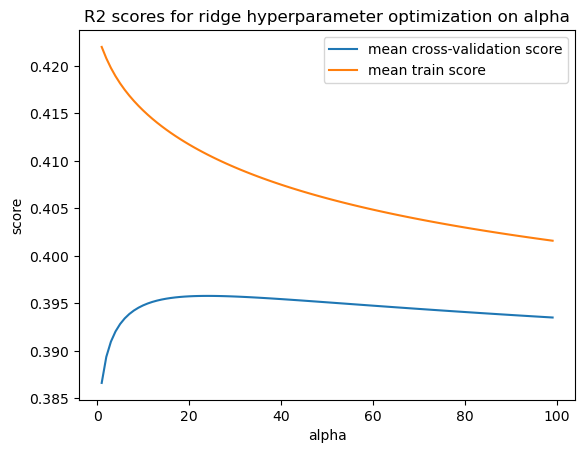

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_ridge__alpha,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
23,0.070532,0.009314,0.031622,0.007489,24,{'ridge__alpha': 24},0.434573,0.398369,0.354409,0.395784,0.032778,1,0.389309,0.408548,0.434127,0.410662,0.018358
24,0.067907,0.015644,0.030674,0.005079,25,{'ridge__alpha': 25},0.434487,0.398567,0.354292,0.395782,0.032799,2,0.389079,0.408276,0.433901,0.410419,0.018361
22,0.077205,0.016250,0.027979,0.004289,23,{'ridge__alpha': 23},0.434657,0.398159,0.354528,0.395781,0.032756,3,0.389548,0.408828,0.434362,0.410913,0.018355
25,0.060112,0.015338,0.037649,0.003651,26,{'ridge__alpha': 26},0.434399,0.398751,0.354176,0.395775,0.032819,4,0.388856,0.408010,0.433683,0.410183,0.018365
21,0.062195,0.005543,0.031641,0.004817,22,{'ridge__alpha': 22},0.434739,0.397935,0.354648,0.395774,0.032733,5,0.389795,0.409116,0.434607,0.411173,0.018352


In [20]:
ax = sns.lineplot(x=ridge_search_cv['param_ridge__alpha'], y=ridge_search_cv['mean_test_score'], label='mean cross-validation score')
ax = sns.lineplot(x=ridge_search_cv['param_ridge__alpha'], y=ridge_search_cv['mean_train_score'], label='mean train score')
ax.set(title='R2 scores for ridge hyperparameter optimization on alpha', xlabel='alpha', ylabel='score')

plt.show()

display(ridge_search_cv.sort_values('rank_test_score').head())

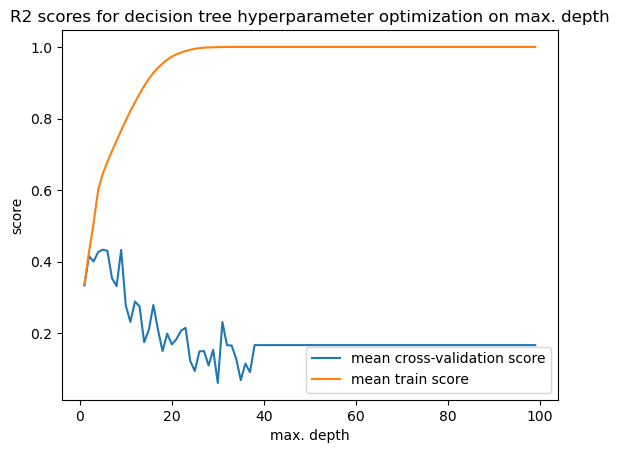

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_decisiontreeregressor__max_depth,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
4,0.120337,0.013971,0.031720,0.010695,5,{'decisiontreeregressor__max_depth': 5},0.252979,0.475263,0.572366,0.433536,0.133686,1,0.634381,0.678524,0.623588,0.645498,0.023765
8,0.153186,0.006763,0.030236,0.008678,9,{'decisiontreeregressor__max_depth': 9},0.222475,0.523392,0.552067,0.432645,0.149073,2,0.759672,0.776731,0.762781,0.766394,0.007418
5,0.116309,0.008549,0.031685,0.006323,6,{'decisiontreeregressor__max_depth': 6},0.285006,0.531157,0.474604,0.430256,0.105270,3,0.665058,0.702073,0.668251,0.678461,0.016747
3,0.102734,0.014192,0.038821,0.009907,4,{'decisiontreeregressor__max_depth': 4},0.231117,0.518092,0.531494,0.426901,0.138548,4,0.605968,0.625278,0.569563,0.600270,0.023100
1,0.073064,0.010799,0.032976,0.002963,2,{'decisiontreeregressor__max_depth': 2},0.441286,0.438630,0.367091,0.415669,0.034367,5,0.412344,0.411194,0.455211,0.426250,0.020484


In [21]:
ax = sns.lineplot(x=decision_tree_search_cv['param_decisiontreeregressor__max_depth'], y=decision_tree_search_cv['mean_test_score'], label='mean cross-validation score')
ax = sns.lineplot(x=decision_tree_search_cv['param_decisiontreeregressor__max_depth'], y=decision_tree_search_cv['mean_train_score'], label='mean train score')
ax.set(title='R2 scores for decision tree hyperparameter optimization on max. depth', xlabel='max. depth', ylabel='score')

plt.show()

display(decision_tree_search_cv.sort_values('rank_test_score').head())

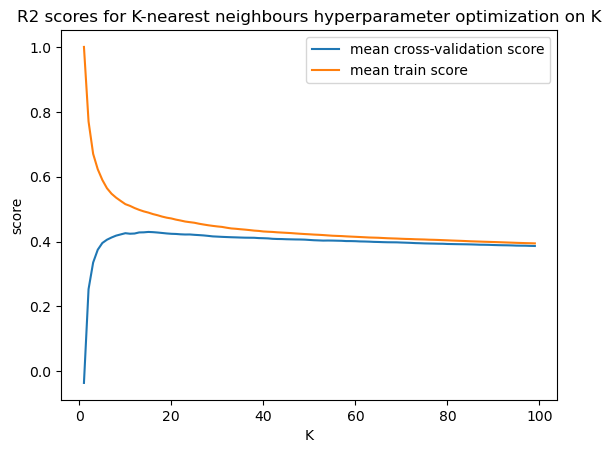

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_kneighborsregressor__n_neighbors,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
14,0.050631,0.012134,0.580846,0.007575,15,{'kneighborsregressor__n_neighbors': 15},0.465715,0.442724,0.380796,0.429745,0.035862,1,0.469011,0.482286,0.516815,0.489371,0.020149
15,0.055196,0.006684,0.588687,0.014165,16,{'kneighborsregressor__n_neighbors': 16},0.466002,0.439333,0.381911,0.429082,0.035087,2,0.465385,0.476842,0.512061,0.484763,0.019861
13,0.041424,0.004589,0.583968,0.036370,14,{'kneighborsregressor__n_neighbors': 14},0.463554,0.441033,0.381010,0.428532,0.034838,3,0.471292,0.487251,0.520720,0.493087,0.020597
12,0.044733,0.002884,0.531105,0.026089,13,{'kneighborsregressor__n_neighbors': 13},0.464306,0.439815,0.380529,0.428217,0.035171,4,0.474869,0.492417,0.526228,0.497838,0.021315
16,0.054531,0.003460,0.668597,0.017470,17,{'kneighborsregressor__n_neighbors': 17},0.465384,0.438170,0.380284,0.427946,0.035486,5,0.462661,0.472176,0.508750,0.481196,0.019867


In [22]:
ax = sns.lineplot(x=knn_search_cv['param_kneighborsregressor__n_neighbors'], y=knn_search_cv['mean_test_score'], label='mean cross-validation score')
ax = sns.lineplot(x=knn_search_cv['param_kneighborsregressor__n_neighbors'], y=knn_search_cv['mean_train_score'], label='mean train score')
ax.set(title='R2 scores for K-nearest neighbours hyperparameter optimization on K', xlabel='K', ylabel='score')

plt.show()

display(knn_search_cv.sort_values('rank_test_score').head())

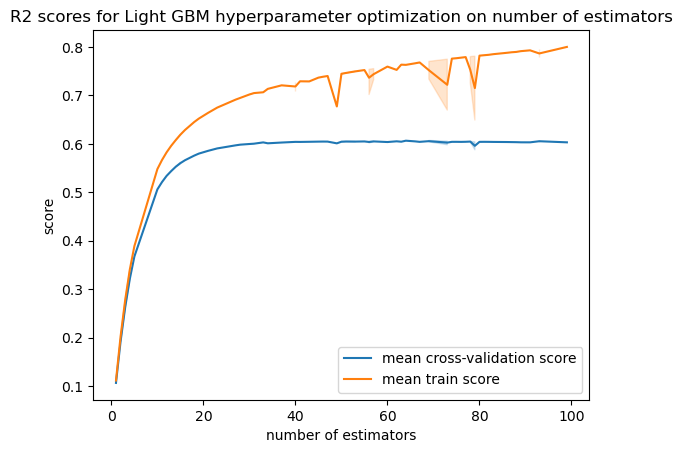

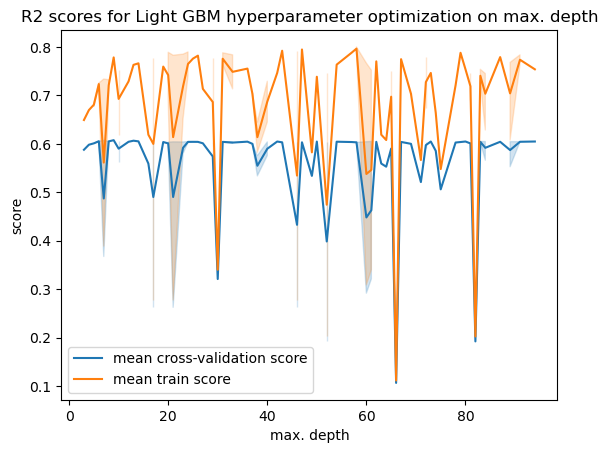

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_lgbmregressor__n_estimators,param_lgbmregressor__max_depth,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
60,1.227141,0.007713,0.036892,0.010559,93,9,"{'lgbmregressor__n_estimators': 93, 'lgbmregre...",0.642531,0.618560,0.561376,0.607489,0.034044,1,0.757411,0.769859,0.807704,0.778325,0.021387
9,0.743287,0.022121,0.042478,0.015573,69,7,"{'lgbmregressor__n_estimators': 69, 'lgbmregre...",0.645929,0.618169,0.556425,0.606841,0.037408,2,0.711221,0.721192,0.768836,0.733750,0.025141
11,0.974142,0.082293,0.050984,0.030577,64,13,"{'lgbmregressor__n_estimators': 64, 'lgbmregre...",0.646512,0.616233,0.556464,0.606403,0.037413,3,0.743161,0.753853,0.791920,0.762978,0.020925
68,0.646147,0.057349,0.082442,0.052732,73,6,"{'lgbmregressor__n_estimators': 73, 'lgbmregre...",0.644815,0.614970,0.556553,0.605446,0.036657,4,0.697367,0.707627,0.758430,0.721141,0.026698
87,0.844730,0.013902,0.034523,0.003712,57,8,"{'lgbmregressor__n_estimators': 57, 'lgbmregre...",0.643289,0.618916,0.554088,0.605431,0.037644,5,0.708156,0.720540,0.767991,0.732229,0.025788


In [23]:
ax = sns.lineplot(x=light_gbm_search_cv['param_lgbmregressor__n_estimators'], y=light_gbm_search_cv['mean_test_score'], label='mean cross-validation score')
ax = sns.lineplot(x=light_gbm_search_cv['param_lgbmregressor__n_estimators'], y=light_gbm_search_cv['mean_train_score'], label='mean train score')
ax.set(title='R2 scores for Light GBM hyperparameter optimization on number of estimators', xlabel='number of estimators', ylabel='score')

plt.show()

ax = sns.lineplot(x=light_gbm_search_cv['param_lgbmregressor__max_depth'], y=light_gbm_search_cv['mean_test_score'], label='mean cross-validation score')
ax = sns.lineplot(x=light_gbm_search_cv['param_lgbmregressor__max_depth'], y=light_gbm_search_cv['mean_train_score'], label='mean train score')
ax.set(title='R2 scores for Light GBM hyperparameter optimization on max. depth', xlabel='max. depth', ylabel='score')

plt.show()

display(light_gbm_search_cv.sort_values('rank_test_score').head())

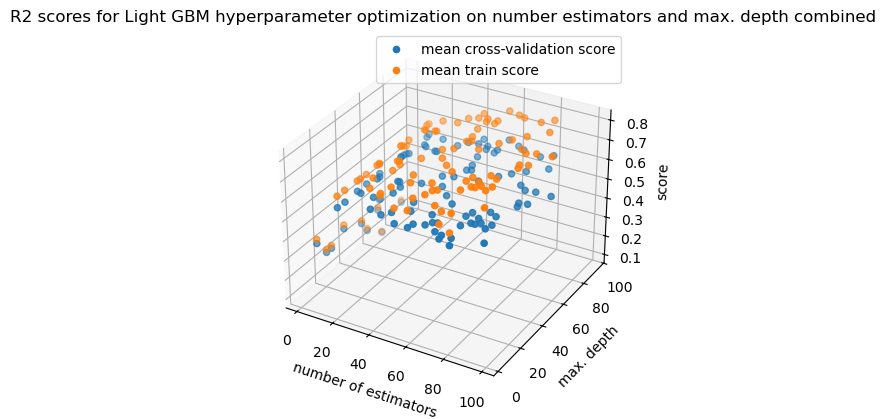

In [24]:
# 3D plots are not very practical; this one is just for fun.
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.scatter(light_gbm_search_cv['param_lgbmregressor__n_estimators'], light_gbm_search_cv['param_lgbmregressor__max_depth'], light_gbm_search_cv['mean_test_score'], label='mean cross-validation score')
ax.scatter(light_gbm_search_cv['param_lgbmregressor__n_estimators'], light_gbm_search_cv['param_lgbmregressor__max_depth'], light_gbm_search_cv['mean_train_score'], label='mean train score')
ax.legend()
ax.set(title='R2 scores for Light GBM hyperparameter optimization on number estimators and max. depth combined', xlabel='number of estimators', ylabel='max. depth', zlabel='score')

plt.show()

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 11. Interpretation and feature importances <a name="1"></a>
<hr>
rubric={points:10}

**Your tasks:**

1. Use the methods we saw in class (e.g., `shap`) (or any other methods of your choice) to examine the most important features of one of the non-linear models. 
2. Summarize your observations. 

<div class="alert alert-warning">
    
Solution_11
    
</div>

_Points:_ 10

@Michael TODO: FIX THIS

run `conda install -n cpsc330 shap` to install shap

maybe count how many features it kept. give theories why the most important few are the most important

In [51]:
from shap import TreeExplainer

explainer = TreeExplainer(optimized_light_gbm_pipeline.steps[-1][1])
listings_train_x_transformed = pd.DataFrame(transform_pipeline.fit_transform(listings_train_x))
listings_train_shap = pd.DataFrame(explainer.shap_values(listings_train_x_transformed), columns=transform_pipeline.get_feature_names_out())

display(listings_train_shap.head())

,pipeline-1__price,pipeline-1__minimum_nights,pipeline-1__number_of_reviews,pipeline-1__calculated_host_listings_count,pipeline-1__availability_365,pipeline-1__relative_price_within_neighbourhood,pipeline-1__minimum_spend,pipeline-1__days_since_last_review,pipeline-1__mean_number_of_reviews_for_host,pipeline-1__dist_to_statue_of_liberty,...,pipeline-2__neighbourhood_Whitestone,pipeline-2__neighbourhood_Williamsbridge,pipeline-2__neighbourhood_Williamsburg,pipeline-2__neighbourhood_Windsor Terrace,pipeline-2__neighbourhood_Woodhaven,pipeline-2__neighbourhood_Woodlawn,pipeline-2__neighbourhood_Woodside,pipeline-2__room_type_Entire home/apt,pipeline-2__room_type_Private room,pipeline-2__room_type_Shared room
0,-0.004283,-0.173111,-0.088765,-0.006295,-0.018938,-0.010397,-0.052367,-0.655788,0.018013,-0.013586,...,0.0,0.0,-0.002491,0.0,0.0,0.0,-0.000405,0.003256,-0.005298,0.000636
1,0.001229,0.118664,-0.645235,-0.018690,0.013308,-0.004547,0.085983,-0.941383,-0.008657,-0.010001,...,0.0,0.0,0.000134,0.0,0.0,0.0,-0.000397,-0.003951,0.002543,0.000592
2,0.000479,-0.164731,-0.000271,-0.008746,-0.036458,0.023311,-0.095309,-0.620270,0.010971,-0.025154,...,0.0,0.0,0.000235,0.0,0.0,0.0,-0.000626,0.007461,-0.002555,0.000689
3,0.085276,0.512611,-0.210058,-0.012536,-0.566948,-0.286768,0.226446,1.656842,-0.076095,0.014412,...,0.0,0.0,0.000179,0.0,0.0,0.0,-0.000613,-0.014522,0.003068,0.003014
4,0.005577,-0.190591,0.477728,-0.012741,0.016762,0.028503,-0.137147,-0.473840,0.012095,-0.017137,...,0.0,0.0,-0.003745,0.0,0.0,0.0,-0.000860,0.007385,-0.003539,0.000579


In [56]:
from shap import force_plot, initjs

initjs()
force_plot(explainer.expected_value, listings_train_shap.to_numpy()[0], listings_train_x_transformed.to_numpy()[0], feature_names=listings_train_shap.columns)

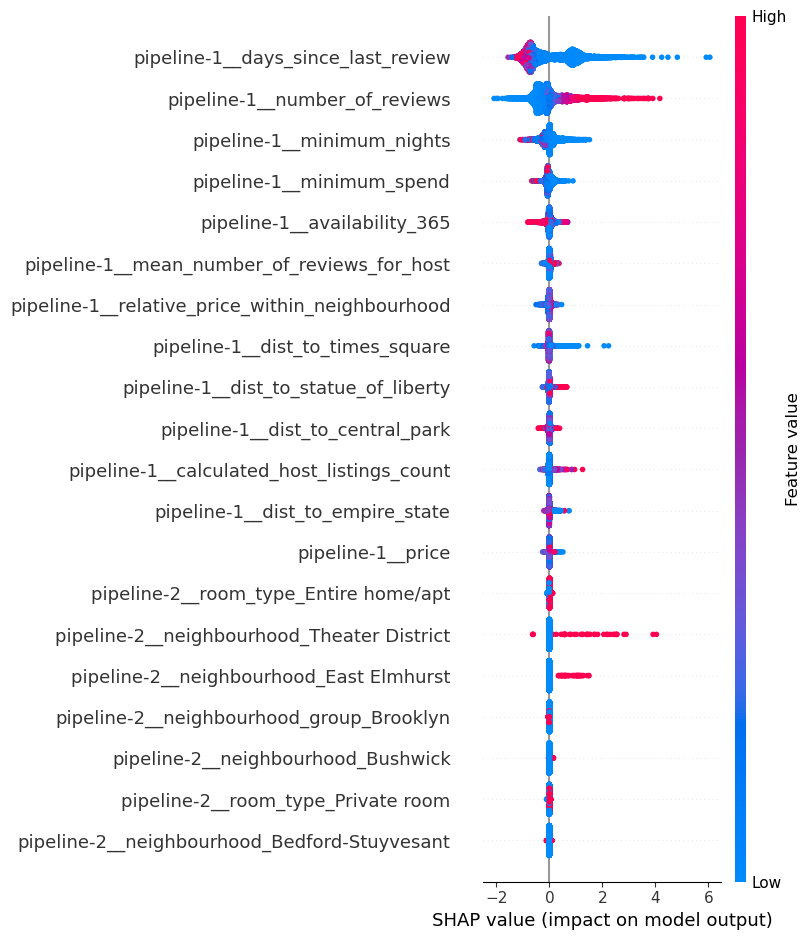

In [59]:
from shap import summary_plot

summary_plot(listings_train_shap.to_numpy(), listings_train_x_transformed, feature_names=listings_train_shap.columns)

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 12. Results on the test set <a name="12"></a>
<hr>

rubric={points:10}

**Your tasks:**

1. Try your best performing model on the test data and report test scores. 
2. Do the test scores agree with the validation scores from before? To what extent do you trust your results? Do you think you've had issues with optimization bias? 
3. Take one or two test predictions and explain these individual predictions (e.g., with SHAP force plots).  

<div class="alert alert-warning">
    
Solution_12
    
</div>

_Points:_ 10

@Michael TODO: FIX THIS

i think it agrees pretty well. for optimization bias you should double check if there was any data leakage in the previous sections but we didnt see the score plummet on unseen data so we are probably fine.

refer to the shap plots above to explain the predictions

In [77]:
from sklearn.metrics import r2_score, mean_absolute_percentage_error, root_mean_squared_error

optimized_light_gbm_pipeline.fit(listings_train_x, listings_train_y)
listings_test_y_predicted = optimized_light_gbm_pipeline.predict(listings_test_x)

best_r2_score = r2_score(listings_test_y, listings_test_y_predicted)
best_rmse = root_mean_squared_error(listings_test_y, listings_test_y_predicted)
best_mape = mean_absolute_percentage_error(listings_test_y, listings_test_y_predicted)

print()
print(f'R2 score: {best_r2_score}')
print(f'MAPE:     {best_mape} %')
print(f'RMSE:     {best_rmse} reviews per month')

listings_test_combined = listings_test_x.copy()
listings_test_combined['reviews_per_month'] = listings_test_y
listings_test_combined['predicted_reviews_per_month'] = listings_test_y_predicted

display(listings_test_combined.head())

[LightGBM] [Info] Total Bins 3044
[LightGBM] [Info] Number of data points in the train set: 11653, number of used features: 92
[LightGBM] [Info] Start training from score 1.391164
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

R2 score: 0.6459338156142526
MAPE:     0.6865811488430499 %
RMSE:     0.9772928475417173 reviews per month


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,calculated_host_listings_count,availability_365,reviews_per_month,predicted_reviews_per_month
14989,11937647,Entire Williamsburg apt.,12446288,Micki & Kristian,Brooklyn,Williamsburg,40.71541,-73.93748,Entire home/apt,110,3,4,2018-05-30,1,0,0.10,0.160876
40517,31409612,Tremendous Views - Greenpoint,56061729,Dennis,Brooklyn,Greenpoint,40.73421,-73.95318,Entire home/apt,125,2,8,2019-06-10,1,188,1.37,1.536059
32631,25635216,Clean and Nice Central Park Apt in Lincoln Center,193127179,Sagawa,Manhattan,Upper West Side,40.77640,-73.98236,Private room,85,4,18,2019-05-03,1,133,1.38,0.629031
39464,30747515,Bedstuy-stay,20043437,Marianne,Brooklyn,Bedford-Stuyvesant,40.68581,-73.95189,Private room,35,10,3,2019-05-31,1,5,0.48,0.576151
26165,20864878,High Line Sun Drenched Home,13462349,Elvis,Manhattan,Chelsea,40.74690,-73.99494,Entire home/apt,200,2,40,2019-06-19,1,288,1.81,2.241065


<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 13. Summary of results <a name="13"></a>
<hr>
rubric={points:12}

Imagine that you want to present the summary of these results to your boss and co-workers. 

**Your tasks:**

1. Create a table summarizing important results. 
2. Write concluding remarks.
3. Discuss other ideas that you did not try but could potentially improve the performance/interpretability . 
3. Report your final test score along with the metric you used at the top of this notebook in the [Submission instructions section](#si).

<div class="alert alert-warning">
    
Solution_13
    
</div>

_Points:_ 12

_Type your answer here, replacing this text._

In [ ]:
...

In [ ]:
...

<!-- END QUESTION -->

<br><br>

<br><br>

<!-- BEGIN QUESTION -->

## 14. Your takeaway <a name="15"></a>
<hr>
rubric={points:2}

**Your tasks:**

What is your biggest takeaway from the supervised machine learning material we have learned so far? Please write thoughtful answers.  

<div class="alert alert-warning">
    
Solution_14
    
</div>

_Points:_ 2

<!-- END QUESTION -->

<br><br>

**PLEASE READ BEFORE YOU SUBMIT:** 

When you are ready to submit your assignment do the following:

1. Run all cells in your notebook to make sure there are no errors by doing `Kernel -> Restart Kernel and Clear All Outputs` and then `Run -> Run All Cells`. 
2. Notebooks with cell execution numbers out of order or not starting from "1" will have marks deducted. Notebooks without the output displayed may not be graded at all (because we need to see the output in order to grade your work).
4. Upload the assignment using Gradescope's drag and drop tool. Check out this [Gradescope Student Guide](https://lthub.ubc.ca/guides/gradescope-student-guide/) if you need help with Gradescope submission. 
5. Make sure that the plots and output are rendered properly in your submitted file. If the .ipynb file is too big and doesn't render on Gradescope, also upload a pdf or html in addition to the .ipynb so that the TAs can view your submission on Gradescope. 

This was a tricky one but you did it! 

![](img/eva-well-done.png)